# **Step2_AI 강사 Agent v2.0**

## **0. 미션**

### **미션③ : 모듈 고도화1**
다음 항목에 대해서 조 상황에 맞게 선택적으로 고도화 합니다.

* 입력 프롬프트 추가 : 강의 목소리, 톤 조절, 강의 스타일 지침
* 정보 분해 : 여러 슬라이드를 저장하고 관리하기 위한 폴더 준비, 불필요한 정보 제거, 제목 추출
* 페이지별 내용 생성 : 슬라이드 내 정보 뿐만 아니라 부연 설명을 위한 검색 기능 추가
* 강의 스크립트 생성 : 전체 강의 내용을 참조하여 강의 흐름을 구상하고,
                                   현재 페이지 강의 스크립트 작성
* 내용 검토 : 페이지 내용과 강의 스크립트 비교, 강의 스크립트 흐름 적절한지 검토




### **미션④ : AI 강사 Agent 완성**
* 모듈 고도화2(다음 항목에 대해서 조 상황에 맞게 선택적으로 고도화 합니다.)
    * 음성 변환 : 강의 목소리, 톤 조절 음성 변환
    * 영상 제작 :
        * 각 페이지 : 음성과 슬라이드 스냅샷 이미지 합성하여 영상 제작하기
        * 전체 강의 영상 : 각 슬라이드 강의를 전체 슬라이드 강의 영상으로 합치기
* 웹 화면 연결(gradio)
    * 음성 변환 : 강의 목소리, 톤 조절 프롬프트 기반 음성 변환
* 전체 Agent 그래프 구축
    * 전체를 Agent 그래프로 엮기


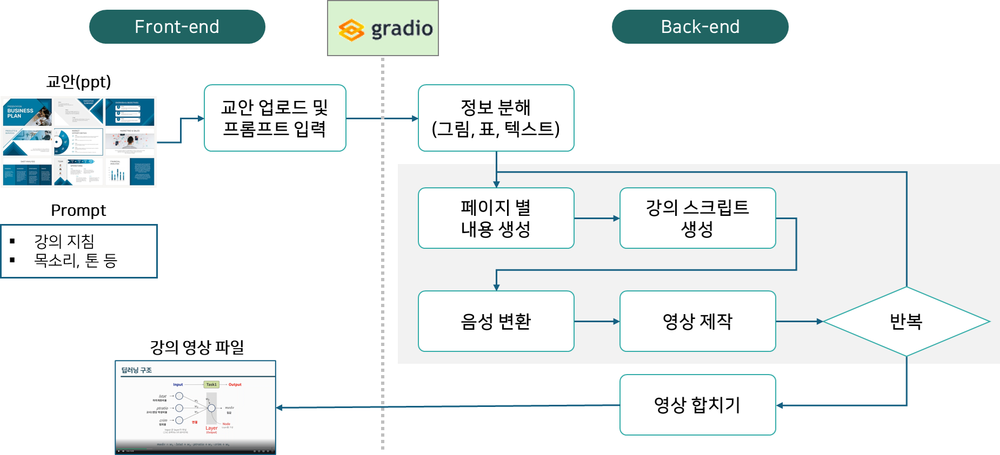

## **1. 환경준비**

### (1) 구글 드라이브

* 구글 드라이브 폴더 생성
    * 새 폴더 `proj1_agent`를 생성하고
    * 제공 받은 파일을 업로드

* 구글 드라이브 연결

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### (2) 한글 폰트 준비
* 한글 폰트 설치 및 설정 코드
* 영상 제작 등 한글 사용시 필요

In [2]:
%%bash
set -e

# (1) 필수 패키지
sudo apt-get update -y
sudo apt-get install -y \
  libreoffice poppler-utils poppler-data ffmpeg locales fontconfig xvfb \
  fonts-noto-core fonts-noto-cjk fonts-noto-cjk-extra

# (2) 로케일
sudo sed -i 's/^# *ko_KR.UTF-8 UTF-8/ko_KR.UTF-8 UTF-8/' /etc/locale.gen
sudo locale-gen ko_KR.UTF-8
sudo update-locale LANG=ko_KR.UTF-8

# (3) 기존에 만들었던 사용자 fonts.conf(전체 덮어쓰기) 제거
rm -f ~/.config/fontconfig/fonts.conf || true

# (4) 시스템 fontconfig에 로컬 룰로만 추가 (기본 설정은 그대로 사용)
sudo tee /etc/fonts/local.conf >/dev/null <<'EOF'
<?xml version="1.0"?>
<!DOCTYPE fontconfig SYSTEM "fonts.dtd">
<fontconfig>

  <!-- 한국어는 Noto Sans KR 우선 -->
  <match target="pattern">
    <test name="lang" compare="contains"><string>ko</string></test>
    <edit name="family" mode="prepend" binding="strong">
      <string>Noto Sans KR</string>
      <string>Noto Sans CJK KR</string>
      <string>Noto Sans</string>
    </edit>
  </match>

  <!-- 흔한 한글 폰트명을 Noto Sans KR로 매핑 -->
  <alias><family>Malgun Gothic</family><prefer><family>Noto Sans KR</family></prefer></alias>
  <alias><family>맑은 고딕</family><prefer><family>Noto Sans KR</family></prefer></alias>
  <alias><family>Apple SD Gothic Neo</family><prefer><family>Noto Sans KR</family></prefer></alias>
  <alias><family>AppleGothic</family><prefer><family>Noto Sans KR</family></prefer></alias>

</fontconfig>
EOF

# (5) 캐시 완전 재생성
rm -rf ~/.cache/fontconfig
sudo fc-cache -r
fc-cache -f -v >/dev/null

# (6) 검증
echo "---- fc-match ko ----"
fc-match "sans-serif:lang=ko"
echo "---- noto candidates ----"
fc-list | grep -i -E "noto.*(sans|cjk).*kr" | head -n 30 || true

Get:1 https://cli.github.com/packages stable InRelease [3,917 B]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:3 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:4 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ Packages [89.0 kB]
Get:5 https://cli.github.com/packages stable/main amd64 Packages [356 B]
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,990 kB]
Get:7 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [10.1 MB]
Get:8 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:9 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:10 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:11 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [3,864 kB]
Get:12 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:13 http://archive.ubuntu.com/ubuntu jammy-updates/multiverse amd64 Packages [86.0 kB]
Get:14 http:/

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
W: Failed to fetch https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu/dists/jammy/InRelease  Could not connect to ppa.launchpadcontent.net:443 (185.125.190.80), connection timed out
W: Failed to fetch https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu/dists/jammy/InRelease  Unable to connect to ppa.launchpadcontent.net:443:
W: Some index files failed to download. They have been ignored, or old ones used instead.
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 150.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to f

### (3) 라이브러리

* 필요한 라이브러리 설치

In [3]:
!pip install langchain-openai langchain-community python-pptx pillow gradio langchain-tavily tavily-python -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 42.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 472.8/472.8 kB 30.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 45.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.4/542.4 kB 32.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.3/175.3 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.0/51.0 kB 3.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests==2.32.4, but you have requests 2.33.1 which is incompatible.


* 라이브러리 로딩

In [21]:
import os, re, textwrap, subprocess, json, base64, mimetypes, shlex
from pathlib import Path
from dataclasses import dataclass
from typing import List, Dict, Optional, TypedDict, Any
from PIL import Image, ImageDraw
from pptx import Presentation
from pptx.enum.shapes import MSO_SHAPE_TYPE
from openai import OpenAI
from google.colab import files
from IPython.display import Audio, display, Video

from langchain_tavily import TavilySearch
from langchain_openai import ChatOpenAI
from langchain_core.messages import SystemMessage, HumanMessage, AIMessage
from langgraph.graph.message import add_messages
from typing import Annotated

### (4) API Key 확인
* 구글드라이브에 생성한 폴더 `proj1_agent` 에서
* api_key.txt 파일 안에 각자 발급 받은 키를 저장합니다.
    * **OPENAI_API_KEY**
    * **TAVILY_API_KEY**

In [5]:
def load_api_keys(filepath="api_key.txt"):
    with open(filepath, "r") as f:
        for line in f:
            line = line.strip()
            if line and "=" in line:
                key, value = line.split("=", 1)
                os.environ[key.strip()] = value.strip()

path = '/content/drive/MyDrive/proj1_agent/'
# API 키 로드 및 환경변수 설정
load_api_keys(path + 'api_key.txt')

⚠️ 아래 코드셀은, 실행해서 key가 제대로 보이는지 확인하고 삭제하세요.

In [6]:
print(os.environ['OPENAI_API_KEY'][:30])
print(os.environ['TAVILY_API_KEY'][:30])

sk-proj-9kaLYbWragOjTSuzNrle-g
tvly-dev-3LfrYm-6yQSUQ0SyG3j1Z


### (5) 유용한 함수들 제공
* 다음은 프로젝트를 수행하는데 유용한 함수들입니다.
* 이 함수들의 내용을 확인하고 필요시 활용하여 개인 과제를 수행합니다.(꼭 활용해야 하는 것은 아닙니다.)

* 공백 제거 함수

In [7]:
def clean_text(s):
    return re.sub(r"\s+", " ", s).strip()

* 긴 문자열을 문장 단위로 나누는 문장 분리기

In [8]:
def split_sents(t: str) -> List[str]:
    parts = re.split(r'([\.?!])', t)
    merged = []
    for i in range(0, len(parts)-1, 2):
        sent = (parts[i] + parts[i+1]).strip()
        if sent: merged.append(sent)
    if len(parts) % 2 == 1 and parts[-1].strip():
        merged.append(parts[-1].strip())
    return [s for s in merged if s]

* 오디오 길이 계산

In [9]:
def ffprobe_duration(path: str) -> float:
    out = subprocess.check_output([
        "ffprobe","-v","error","-show_entries","format=duration",
        "-of","default=noprint_wrappers=1:nokey=1", path]).decode().strip()
    return float(out)

* 이미지를 base64로 변환

In [10]:
def img_to_data_url(path: str) -> str:
    mime = mimetypes.guess_type(path)[0] or "image/png"
    with open(path, "rb") as f:
        b64 = base64.b64encode(f.read()).decode("utf-8")
    return f"data:{mime};base64,{b64}"

* 배경 이미지와 오디오 합쳐서 MP4 영상 만들기

In [11]:
def render_mp4(image_path: str, audio_path: str, out_mp4: str,
               width=1920, height=1080, ):

    dur = ffprobe_duration(audio_path)

    vf = (f"scale={width}:{height}:force_original_aspect_ratio=decrease,"
          f"pad={width}:{height}:(ow-iw)/2:(oh-ih)/2:color=black"  )

    # FFmpeg 명령
    cmd = ["ffmpeg", "-y",
            "-loop", "1", "-i", image_path,   # 정지 이미지 입력
            "-i", audio_path,                 # 오디오 입력
            "-t", str(dur),                   # 길이 = 오디오 길이
            "-vf", vf,                        # 비디오 필터
            "-c:v", "libx264", "-preset", "veryfast", "-crf", "20",
            "-c:a", "aac", "-b:a", "192k",
            "-pix_fmt", "yuv420p",
            "-movflags", "+faststart",        # 웹/브라우저 재생 친화
            out_mp4]
    subprocess.check_call(cmd)  # 외부 프로그램(FFmpeg)을 파이썬 프로세스에서 실행하고, 성공했는지 확인

* ppt 슬라이드를 배경 이미지로 저장
    * 강의 영상에서 사용할 배경 이미지 생성하기
    * ppt를 pdf로 변환한 뒤 다시 이미지로 변환

In [12]:
import os, subprocess, uuid
from pathlib import Path

def export_slide_as_png(state: dict, dpi: int = 220) -> dict:
    work_dir = Path(state["work_dir"]).expanduser().resolve()
    work_dir.mkdir(parents=True, exist_ok=True)

    pptx = Path(state["pptx_path"]).expanduser().resolve()
    if not pptx.exists():
        raise FileNotFoundError(f"PPTX 없음: {pptx}")

    idx = int(state.get("slide_index", 0))  # 0-based
    page_no = idx + 1
    out_prefix = work_dir / "slide_img"

    # LibreOffice 프로필(캐시) 꼬임 방지
    lo_profile = f"file:///tmp/lo_profile_{uuid.uuid4().hex}"

    # fontconfig/locale 강제
    env = os.environ.copy()
    env.update({
        "LANG": "ko_KR.UTF-8",
        "LC_ALL": "ko_KR.UTF-8",
        "FONTCONFIG_PATH": str(Path("~/.config/fontconfig").expanduser()),
        "FONTCONFIG_FILE": str(Path("~/.config/fontconfig/fonts.conf").expanduser()),
        "HOME": str(Path("~").expanduser()),
        "XDG_CACHE_HOME": str(Path("~/.cache").expanduser()),
        "SAL_USE_VCLPLUGIN": "gen",
    })

    def run_lo_convert(convert_to: str):
        # X11 요구 해결: xvfb-run로 감싼다 (Colab 필수급)
        cmd = [
            "xvfb-run", "-a",
            "soffice", "--headless", "--nologo", "--nofirststartwizard", "--norestore",
            f"-env:UserInstallation={lo_profile}",
            "--convert-to", convert_to,
            "--outdir", str(work_dir),
            str(pptx),
        ]
        return subprocess.run(cmd, capture_output=True, text=True, env=env)

    # --- A) PPTX → PNG ---
    before_png = set(work_dir.glob("*.png"))
    res_png = run_lo_convert("png:impress_png_Export")

    created_png = [p for p in work_dir.glob("*.png") if p not in before_png]
    candidate = None

    exact = [p for p in created_png if p.stem.endswith(f"-{page_no}")]
    if exact:
        candidate = max(exact, key=lambda p: p.stat().st_mtime)
    elif created_png:
        candidate = max(created_png, key=lambda p: p.stat().st_mtime)

    if candidate and candidate.exists():
        state["slide_image"] = str(candidate)
        return state

    # --- B) 폴백: PPTX → PDF → PNG ---
    before_pdf = set(work_dir.glob("*.pdf"))
    res_pdf = run_lo_convert("pdf:impress_pdf_Export")

    target_pdf = work_dir / f"{pptx.stem}.pdf"
    created_pdf = [p for p in work_dir.glob("*.pdf") if p not in before_pdf]

    if target_pdf.exists():
        pdf_path = target_pdf
    elif created_pdf:
        pdf_path = max(created_pdf, key=lambda p: p.stat().st_mtime)
    else:
        print("LibreOffice PPTX→PDF 변환 실패")
        print("stdout:", res_pdf.stdout)
        print("stderr:", res_pdf.stderr)
        raise RuntimeError("PPTX → PDF 변환 실패")

    ppm_cmd = [
        "pdftoppm",
        "-f", str(page_no), "-l", str(page_no),
        "-png", "-r", str(dpi),
        str(pdf_path),
        str(out_prefix)
    ]
    res2 = subprocess.run(ppm_cmd, capture_output=True, text=True, env=env)

    png_path = Path(f"{out_prefix}-{page_no}.png")
    if not png_path.exists():
        print("pdftoppm 변환 실패")
        print("stdout:", res2.stdout)
        print("stderr:", res2.stderr)
        raise RuntimeError("PDF → PNG 변환 실패")

    state["slide_image"] = str(png_path)
    return state

* 영상 합치기 : 여러 영상 경로를 리스트로 입력 받아 합치기

In [13]:
def concat_videos_ffmpeg(video_paths: List[str], out_path: str, reencode: bool=False):
    list_path = out_path + ".txt"
    with open(list_path, "w", encoding="utf-8") as f:
        for v in video_paths:
            f.write(f"file '{os.path.abspath(v)}'\n")
    if reencode:
        cmd = [
            "ffmpeg","-y","-safe","0","-f","concat","-i",list_path,
            "-vf","format=yuv420p",
            "-c:v","libx264","-preset","veryfast",
            "-c:a","aac","-b:a","192k",
            out_path
        ]
    else:
        cmd = ["ffmpeg","-y","-safe","0","-f","concat","-i",list_path,"-c","copy",out_path]
    subprocess.check_call(cmd)

-----

**[주의!]**🚨🚨🚨🚨🚨
* 아래 제공되는 코드 혹은 노드를 그대로 사용할 경우, 오류가 발생될 수 있습니다.
* 코드 내용을 반드시 확인하고, 여러분의 프로젝트에 맞게 수정해서 사용하세요.

-----

## **2. 미션③ : 모듈 고도화1**
(다음 항목에 대해서 조 상황에 맞게 선택적으로 고도화 합니다.)
* 입력 프롬프트 추가 : 강의 목소리, 톤 조절, 강의 스타일 지침
* 정보 분해 : 여러 슬라이드를 저장하고 관리하기 위한 폴더 준비, 불필요한 정보 제거, 제목 추출
* 페이지별 내용 생성 : 슬라이드 내 정보 뿐만 아니라 부연 설명을 위한 검색 기능 추가
* 강의 스크립트 생성 : 전체 강의 내용을 참조하여 강의 흐름을 구상하고,
                                   현재 페이지 강의 스크립트 작성
* 내용 검토 : 페이지 내용과 강의 스크립트 비교, 강의 스크립트 흐름 적절한지 검토

### (1) 파일 입력

* ppt 파일



In [44]:
# 파일 업로드
uploaded = files.upload()
pptx_path = list(uploaded.keys())[0]

Saving sample2.pptx to sample2 (2).pptx


In [45]:
# 사용자 프롬프트
USER_PROMPT = {
    "voice": "alloy",
    "tone": "친절하고 명료한 강의 톤",
    "style": "예시와 핵심 요점 중심"
}
# 출력 dir 만들기
WORK_DIR = "./step1_output"
MEDIA_DIR = "./step1_output/media"
os.makedirs(WORK_DIR, exist_ok=True)
os.makedirs(MEDIA_DIR, exist_ok=True)

### (2) State 선언

* 각 노드의 입출력 관리를 위한 State 구성
    * 각 함수(노드)에서 채워가며 관리해야 할 정보를 도출
    * 이를 하나의 State로 정의


In [160]:
# State 정의 및 초기화
class State(TypedDict, total=False): # total=False는 TypedDict에서 모든 키를 선택(optional)으로 취급
    # 입력/기본
    pptx_path: str
    work_dir: str
    prompt: Dict

    # ppt 슬라이드 데이터
    slides: List[Dict[str, Any]] # [{index, title, texts, tables, images, snap, script}] 저장
    n_slides: int                # 전체 슬라이드 개수
    slide_index: int             # 현재 슬라이드 index

    #임시 (반복 내부 사용)
    cur_search_context: str
    cur_page_content: str
    cur_script: str
    cur_audio: str
    cur_video: str
    cur_video_subtitled: str

    # video 산출물
    video_paths: List[str] # 개별 영상 리스트
    final_video : str      # 합체된 최종 영상 주소

    # <<tavily ToolNode는 내부적으로 state['messages'] 를 읽고 씀. 검색 기능 추가용 message 저장 list>
    messages: Annotated[list, add_messages]

In [161]:
state1: State = {
    "pptx_path": pptx_path,
    "work_dir": WORK_DIR,
    "prompt": USER_PROMPT
    }
state1

{'pptx_path': 'sample2 (3).pptx',
 'work_dir': './step1_output',
 'prompt': {'voice': 'alloy',
  'tone': '친절하고 명료한 강의 톤',
  'style': '예시와 핵심 요점 중심'}}

* 모델 준비

In [162]:
LLM_MODEL = "gpt-4o-mini"
TTS_MODEL = "gpt-4o-mini-tts"

llm = ChatOpenAI(model=LLM_MODEL, temperature=0.3)

### (3) ppt 정보 분해
* 목적: 전체 슬라이드의 텍스트/표/이미지/스냅샷 수집 → state["slides"] 적재
* 입력: pptx_path, work_dir
* 출력: 슬라이드마다, text, image, text, 스냅(스크린샷) 등 저장
* 처리:
    * python-pptx로 텍스트/표/이미지 추출
    * 제목 추출
    * export_slide_as_png로 snap 생성

* 노드 함수 생성 (일부 제공)

In [166]:
def node_parse_all(state: State) -> State:
    '파서 노드 내부에서 반복문으로 모든 슬라이드 텍스트/표/이미지 + 스냅샷 생성'

    print('1. ppt 내용 전체 파싱')

    # 기본 사항 초기화
    pres = Presentation(state["pptx_path"])
    work_dir = state["work_dir"]
    media_dir = os.path.join(work_dir, "media")
    os.makedirs(media_dir, exist_ok=True)

    slides_out: List[Dict[str, Any]] = []

    # 반복문으로 각 슬라이드 마다 텍스트/표/이미지 추출
    for idx, slide in enumerate(pres.slides, start=1):

        # 1. 제목 추출
        title_shape = slide.shapes.title
        title = title_shape.text if title_shape else "제목 없음"

        # 2. 텍스트/표/이미지 추출
        texts, tables, images = [],[],[]

        for i, sh in enumerate(slide.shapes):
            if sh.has_text_frame:
                txt = "\n".join(p.text for p in sh.text_frame.paragraphs)
                texts.append(txt)
            if sh.shape_type == MSO_SHAPE_TYPE.TABLE:
                tbl = [[clean_text(c.text) for c in r.cells] for r in sh.table.rows]
                tables.append(tbl)
            if sh.shape_type == MSO_SHAPE_TYPE.PICTURE:
                ext = sh.image.ext
                # <<image 저장 path에 slide index 추가>>
                path = os.path.join(MEDIA_DIR, f"{os.path.splitext(os.path.basename(pptx_path))[0]}_slide{idx}_{i}.{ext}")
                images.append(path)
                try:
                    with open(path, "wb") as f: f.write(sh.image.blob)
                    print(f"path 위치: {path}")
                except Exception as e:
                    print(f"ppt 정보 분해 중 오류 발생: {e}")

        # 3. 스냅샷 추출(export_slide_as_png 사용)
        tmp_state = {"pptx_path": state["pptx_path"], "work_dir": work_dir, "slide_index": idx-1}
        snap_state = export_slide_as_png(tmp_state)
        snap = snap_state["slide_image"]

        # 4. 결과물 취합
        slides_out.append({
            "index": idx,
            "title": title,
            "texts": texts,
            "tables": tables,
            "images": images,
            "snap": snap,
            'script' : ''
        })

    # ppt parsing 결과물 저장
    state["slides"] = slides_out
    state["n_slides"] = len(slides_out)
    state['slide_index'] = 0

    # 그 외 모든 변수 초기화
    state['cur_search_context'], state['cur_page_content'], state['cur_script'], state['cur_audio'], state['cur_video'], state['cur_video_subtitled'] = '','','','','',''
    state['video_paths'], state['final_video'] = [],  ''
    state['messages'] = []

    return state

* 노드 테스트

In [ ]:
state2 = node_parse_all(state1)
state2

1. ppt 내용 전체 파싱
path 위치: ./step1_output/media/sample2_slide1_2.png
path 위치: ./step1_output/media/sample2_slide2_2.png


{'pptx_path': 'sample2.pptx',
 'work_dir': './step1_output',
 'prompt': {'voice': 'alloy', 'tone': '똥마려워 조급한 톤', 'style': '예시와 핵심 요점 중심'},
 'slides': [{'index': 1,
   'title': '모델 성능 모니터링',
   'texts': ['모델 모니터링\n프로덕션 환경에서 ML 모델의 성능 및 동작을 지속적으로 추적, 분석, 평가하는 프로세스\n필요성 : 모델은 배포 후에도 품질 저하, 데이터 문제, 사용 환경 변화 등의 위험에 노출됨\n주요 리스크\n데이터/컨셉 드리프트\n데이터 품질 문제\n적대적 공격(예: prompt injection)\n연결된 앞 단계의 모델 오류 전파\n모니터링 목표\n문제 조기 탐지\n근본 원인 분석\n모델 동작 이해 및 투명한 문서화',
    '모델 성능 모니터링',
    '1'],
   'tables': [],
   'images': ['./step1_output/media/sample2_slide1_2.png'],
   'snap': '/content/step1_output/slide_img-1.png'},
  {'index': 2,
   'title': 'ML 모델에 영향을 줄 수 있는 요인',
   'texts': ['최초 정의한 문제의 컨셉 변화(Concept Drift)\n시간 경과에 따라 데이터 변수 또는 패턴 간의 관계가 지속적으로 변할 수 있음.\n모델 환경에 갑작스럽고 예상치 못한 변화가 발생하여 성능에 상당한 영향을 미칠 수 있는 상황\x0b(예 : COVID-19)',
    'ML 모델에 영향을 줄 수 있는 요인',
    '2'],
   'tables': [],
   'images': ['./step1_output/media/sample2_slide2_2.png'],
   'snap': '/content/step1_output/slide_img-2.png'},
  {'index'

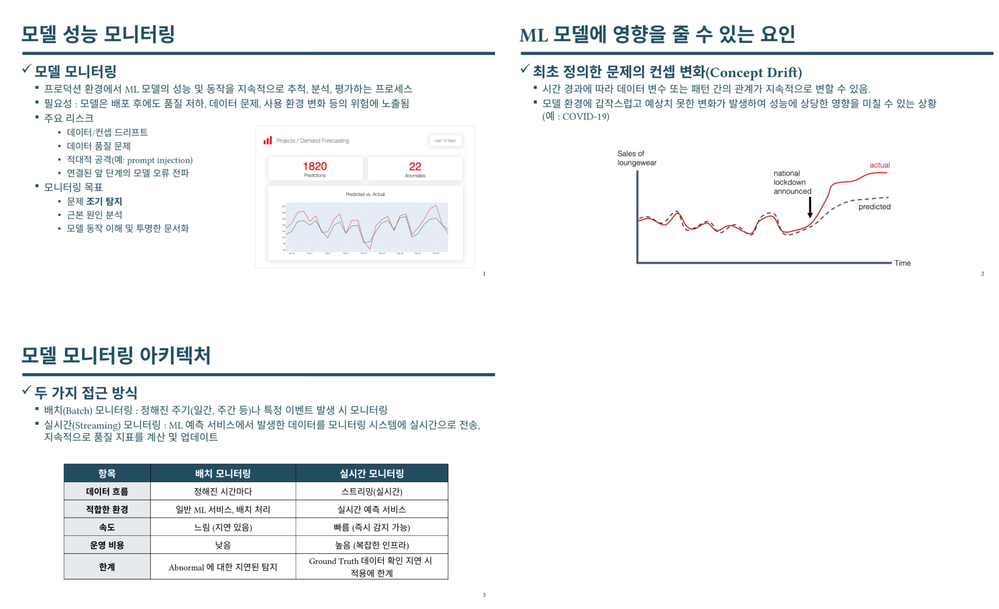

In [ ]:
# 슬라이드 이미지 조회 테스트
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

n = state2["n_slides"]
cols = 2
rows = (n + cols - 1) // cols

plt.figure(figsize=(15, 5 * rows))

for idx, slide in enumerate(state2["slides"]):
    img_path = slide.get("snap")
    title = slide.get("title", f"Slide {idx+1}")

    plt.subplot(rows, cols, idx + 1)
    if img_path and os.path.exists(img_path):
        img = mpimg.imread(img_path)
        plt.imshow(img)
    else:
        plt.text(0.5, 0.5, f"이미지 없음\n{img_path}", ha='center', va='center')

    plt.axis('off')

plt.tight_layout()
plt.show()

### (4) 내용 생성

* 목적: 슬라이드 내용을 text로 정리
* 입력 : text, image, 표, 슬라이드 제목
* 출력 : 슬라이드 설명문
* 처리
    * 슬라이드 제목으로 SerpAPI 검색 및 요약
    * text, image, 표에 대한 설명문 생성
    * 전체 설명문 작성

#### **1) 텍스트 정제 함수**

In [167]:
def node_generate_text(state : State)->State:
  # <<slides의 slide_index 번째 dictionary 가져와 그 안의 title, texts, tables, images, snap 사용>>

  print('2. parsing 데이터 텍스트 정제')

  # 현재 처리중인 slide_index의 파싱 결과 가져오기
  cur_index = state['slide_index']
  slide = state['slides'][cur_index]

  # 현재 slide 파싱 결과의 요소들 (제목, 텍스트, 테이블, 이미지, 스냅 이미지) 가져오기
  title = slide.get('title', '')
  texts = slide.get('texts', [])
  tables = slide.get("tables", [])
  table_snip = ""
  if tables:
      try:
          table_snip = "\n".join([" | ".join(map(str, r)) for r in tables[0][:6]])
      except Exception:
          table_snip = str(tables[0][:6])

  images = list(slide.get("images", []) or [])

  slide_img = slide.get("snap")
  if slide_img:
      if isinstance(slide_img, list):
          if slide_img and slide_img[0] not in images:
              images.insert(0, slide_img[0])
      else:
          if slide_img not in images:
                images.insert(0, slide_img)

  # system message, user message 구성
  sys_msg = f'''당신은 PPT 내용 정리 전문가입니다.
  아래는 PPT로부터 추출한 PPT 객체 내용들입니다. 객체 내용을 참고해 전체 내용을 정리해주세요.

  규칙
  1. 어떠한 내용도 왜곡, 과장하거나 빠트리지 말 것.
  2. 있는 그대로 모든 것을 설명할 것.
  '''

  user_text = []
  user_text.append(f"[제목]\n{title if title else '[제목 없음]'}")
  user_text.append(f"[텍스트]\n{texts if texts else '[없음]'}")
  user_text.append(f"[표]\n{table_snip if table_snip else '[없음]'}")
  user_text = "\n\n".join(user_text)
  human_msg = [{"type":"text","text":user_text}]

  # message에 image 추가
  for image in images:
    try:
      data_url = img_to_data_url(image)
      human_msg.append({"type": "image_url", "image_url": {"url": data_url}})
    except Exception:
      pass

  # LLM 호출 후 결과 저장
  result = llm.invoke([
      SystemMessage(content = sys_msg),
      HumanMessage(content = human_msg)
  ])

  state['cur_page_content'] = result.content

  state['messages'] = [AIMessage(content = f"[정제 text]\n{result.content}\n[Tool검색]")]

  return state


* 노드 테스트

In [ ]:
state3 = node_generate_text(state2)
state3

2. parsing 데이터 텍스트 정제


{'pptx_path': 'sample2.pptx',
 'work_dir': './step1_output',
 'prompt': {'voice': 'alloy', 'tone': '똥마려워 조급한 톤', 'style': '예시와 핵심 요점 중심'},
 'slides': [{'index': 1,
   'title': '모델 성능 모니터링',
   'texts': ['모델 모니터링\n프로덕션 환경에서 ML 모델의 성능 및 동작을 지속적으로 추적, 분석, 평가하는 프로세스\n필요성 : 모델은 배포 후에도 품질 저하, 데이터 문제, 사용 환경 변화 등의 위험에 노출됨\n주요 리스크\n데이터/컨셉 드리프트\n데이터 품질 문제\n적대적 공격(예: prompt injection)\n연결된 앞 단계의 모델 오류 전파\n모니터링 목표\n문제 조기 탐지\n근본 원인 분석\n모델 동작 이해 및 투명한 문서화',
    '모델 성능 모니터링',
    '1'],
   'tables': [],
   'images': ['./step1_output/media/sample2_slide1_2.png'],
   'snap': '/content/step1_output/slide_img-1.png'},
  {'index': 2,
   'title': 'ML 모델에 영향을 줄 수 있는 요인',
   'texts': ['최초 정의한 문제의 컨셉 변화(Concept Drift)\n시간 경과에 따라 데이터 변수 또는 패턴 간의 관계가 지속적으로 변할 수 있음.\n모델 환경에 갑작스럽고 예상치 못한 변화가 발생하여 성능에 상당한 영향을 미칠 수 있는 상황\x0b(예 : COVID-19)',
    'ML 모델에 영향을 줄 수 있는 요인',
    '2'],
   'tables': [],
   'images': ['./step1_output/media/sample2_slide2_2.png'],
   'snap': '/content/step1_output/slide_img-2.png'},
  {'index'

#### **2) 검색 추가 함수**

In [ ]:
# 특정 node에서 tool 실행 후 다시 돌아와 특성 node를 다시 실행하는 함수 작동 테스트는 단일 함수로는 안되고 Graph를 만들어 테스트해야 함.

In [168]:
from langchain_tavily import TavilySearch
from langgraph.prebuilt import ToolNode

tavily_tool = TavilySearch(max_results = 1)

tool_list = [tavily_tool]
tool_node = ToolNode(tool_list)

llm_with_tools = llm.bind_tools(tool_list)

In [169]:
def tool_search(state : State):
  print('3. Tool 사용 여부 검색')

  # 프롬프트 작성
  sys_msg = """
  당신은 검색 전문가입니다. 다음 내용을 보고 보출할 내용 하나를 도구를 사용해 검색해주세요.
  검색했다면 그 내용을 3문장으로 요약해주세요.'

  [내용]
  """

  human_msg = "\n\n".join([message.content for message in state['messages']])

  # LLM 호출
  result = llm_with_tools.invoke([SystemMessage(content = sys_msg), HumanMessage(content = human_msg)])

  return {'cur_search_context' : result.content,
          'messages' : [result]}

def is_tool_needed(state : State):
  if state['messages'][-1].tool_calls:
    return 'tool_call'
  return 'no_tool_call'

- 시험

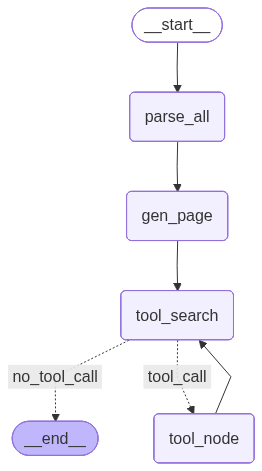

In [ ]:
from langgraph.graph import StateGraph, START, END
builder = StateGraph(State)

builder.add_node('parse_all', node_parse_all)
builder.add_node('gen_page', node_generate_text)
builder.add_node('tool_search', tool_search)
builder.add_node('tool_node', tool_node)

builder.add_edge(START, 'parse_all')
builder.add_edge('parse_all', 'gen_page')
builder.add_edge('gen_page', 'tool_search')
builder.add_conditional_edges('tool_search', is_tool_needed,
                              {'tool_call' : 'tool_node', 'no_tool_call' : END})
builder.add_edge('tool_node', 'tool_search')
builder.add_edge('tool_search', END)
graph_tmp = builder.compile()
graph_tmp

In [ ]:
state1: State = {
    "pptx_path": pptx_path,
    "work_dir": WORK_DIR,
    "prompt": USER_PROMPT
    }

result = graph_tmp.invoke(state1)

1. ppt 내용 전체 파싱
path 위치: ./step1_output/media/sample2_slide1_2.png
path 위치: ./step1_output/media/sample2_slide2_2.png
2. parsing 데이터 텍스트 정제
3. Tool 사용 여부 검색
3. Tool 사용 여부 검색


In [ ]:
result

{'pptx_path': 'sample2.pptx',
 'work_dir': './step1_output',
 'prompt': {'voice': 'alloy',
  'tone': '친절하고 명료한 강의 톤',
  'style': '예시와 핵심 요점 중심'},
 'slides': [{'index': 1,
   'title': '모델 성능 모니터링',
   'texts': ['모델 모니터링\n프로덕션 환경에서 ML 모델의 성능 및 동작을 지속적으로 추적, 분석, 평가하는 프로세스\n필요성 : 모델은 배포 후에도 품질 저하, 데이터 문제, 사용 환경 변화 등의 위험에 노출됨\n주요 리스크\n데이터/컨셉 드리프트\n데이터 품질 문제\n적대적 공격(예: prompt injection)\n연결된 앞 단계의 모델 오류 전파\n모니터링 목표\n문제 조기 탐지\n근본 원인 분석\n모델 동작 이해 및 투명한 문서화',
    '모델 성능 모니터링',
    '1'],
   'tables': [],
   'images': ['./step1_output/media/sample2_slide1_2.png'],
   'snap': '/content/step1_output/slide_img-1.png'},
  {'index': 2,
   'title': 'ML 모델에 영향을 줄 수 있는 요인',
   'texts': ['최초 정의한 문제의 컨셉 변화(Concept Drift)\n시간 경과에 따라 데이터 변수 또는 패턴 간의 관계가 지속적으로 변할 수 있음.\n모델 환경에 갑작스럽고 예상치 못한 변화가 발생하여 성능에 상당한 영향을 미칠 수 있는 상황\x0b(예 : COVID-19)',
    'ML 모델에 영향을 줄 수 있는 요인',
    '2'],
   'tables': [],
   'images': ['./step1_output/media/sample2_slide2_2.png'],
   'snap': '/content/step1_output/slide_img-2.png'},
  {

### (5) 강의 스크립트

* 목적 : 슬라이드 요약(page_content)을 기반으로 60~90초 분량의 발표 대본(스크립트)을 작성하고 저장
* 입력:
    * 슬라이드 설명문
    * tone, 말투 지시 프롬프트
    * 스크립트 저장 디렉토리
    * 이전 페이지의 강의 스크립트(맥락/흐름 파악용)
* 출력: 생성된 발표 스크립트

* 노드 함수 생성

In [200]:
from langchain_core.messages import ToolMessage
from langchain_core.messages import RemoveMessage

def node_generate_script(state: State) -> State:

    print('4. 스크립트 생성')

    # 1. 정보 불러오기
    # 기본 정보
    work_dir = state.get("work_dir", "./")
    prompt = state.get("prompt", "")
    style_prompt = prompt.get('style', '예시와 핵심 요점 중심')

    # 정제 텍스트, 검색 결과
    cur_page_content = state.get("cur_page_content", "검색 결과 없음")
    cur_search_context = state.get('cur_search_context', '슬라이드 컨텐츠 없음')

    slide_index = state.get('slide_index')
    n_slides = state.get('n_slides')


    # 2. 프롬프트 구성

    # 인사말 : 첫 번째와 마지막 슬라이드에만 인사말 추가하고 그 외에는 금지.
    introduction = "인사말을 추가하지 마세요."

    if slide_index == 0:
      titles = ', '.join([s.get('title') for s in state['slides']])
      introduction = f"현재 슬라이드는 첫 번째 슬라이드입니다. 무엇을 배울 것인지를 주제를 설명하는 인사말을 추가해주세요. 전체 슬라이드 제목은 다음과 같습니다 : {titles}"

    if slide_index + 1 == n_slides:
      titles = ', '.join([s.get('title') for s in state['slides']])
      introduction = f"현재 슬라이드는 마지막 슬라이드입니다. 지금까지 배운 것을 정리하는 마무리 멘트를 추가해주세요. 전체 슬라이드 제목은 다음과 같습니다 : {titles}"

    # 이전 스크립트 : 현재 스크립트 생성 시 이전 스크립트에 이미 설명한 내용 제외
    prev_slides = state['slides'][max(0, slide_index-2):slide_index]
    if prev_slides:
      prev_scripts = "\n".join([s.get('script', '') for s in prev_slides])
    else:
      prev_scripts = "이전 스크립트 없음"

    # 프롬프트
    sys_msg = f"""
# 역할
당신은 전문 발표 대본 작성 에이전트입니다.
제공된 현재 슬라이드 컨텐츠 내용을 바탕으로 20초 분량의 자연스러운 발표 스크립트를 작성해 주세요.
제공된 슬라이드 컨텐츠에는 제목, 텍스트, 표, 이미지 데이터가 포함되어 있습니다. 포함된 모든 내용을 연관지어 작성해주세요.
단, 이전 스크립트에서 설명한 내용은 제외하세요.
스크립트 마지막에는 검색 결과에 대한 내용을 2 문장 추가해주세요.

# 규칙
1. 불필요한 추측이나 과장 금지.
2. 대본 외의 설명을 추가 금지.
3. 발표 스크립트의 마지막 부분에는 항상 검색결과에 대한 내용을 2 문장으로 추가.
4. 이전 스크립트에서 설명한 내용 포함 금지

# 인사말
{introduction}

"""

    human_msg = f"""
# 현재 슬라이드 컨텐츠
{cur_page_content}

# 이전 스크립트
{prev_scripts}

# 검색결과
{cur_search_context}

# 스타일
{style_prompt}
"""

    result = llm.invoke([SystemMessage(content=sys_msg), HumanMessage(content=human_msg)])

    # 3. 결과 저장

    # State에 저장
    state["cur_script"] = result.content                       # 현재 분기 처리용 cur_script
    state['slides'][slide_index]['script'] = result.content    # 스크립트 생성 시 맥락 파악용 영구 저장 slides dictionary

    # 파일에 저장
    file_path = os.path.join(work_dir, f"script_{slide_index+1}.txt")

    try:
        with open(file_path, "w", encoding='utf-8') as f:
            f.write(state["cur_script"])
        print(f"스크립트 저장 완료: {file_path}")
    except UnicodeEncodeError:
        print(f"경고: {file_path} 인코딩 중 일부 문자가 치환되었습니다.")
        with open(file_path, "w", encoding="utf-8", errors="replace") as f: # 실패 시 에러 문자를 대체하여 강제 저장
            f.write(state["cur_script"])
    except Exception as e:
        print(f"스크립트 파일 저장 중 오류 발생: {e}")


    return state


In [179]:
node_generate_script(final_state)

4. 스크립트 생성

# 역할
당신은 전문 발표 대본 작성 에이전트입니다.
제공된 현재 슬라이드 컨텐츠 내용을 바탕으로 20초 분량의 자연스러운 발표 스크립트를 작성해 주세요.
제공된 슬라이드 컨텐츠에는 제목, 텍스트, 표, 이미지 데이터가 포함되어 있습니다. 포함된 모든 내용을 연관지어 작성해주세요.
단, 이전 스크립트에서 설명한 내용은 제외하세요.
스크립트 마지막에는 검색 결과에 대한 내용을 2 문장 추가해주세요.

# 규칙
1. 불필요한 추측이나 과장 금지.
2. 대본 외의 설명을 추가 금지.
3. 발표 스크립트의 마지막 부분에는 항상 검색결과에 대한 내용을 2 문장으로 추가.
4. 이전 스크립트에서 설명한 내용 포함 금지


# 인사말
현재 슬라이드는 첫 번째 슬라이드입니다. 무엇을 배울 것인지를 주제를 설명하는 인사말을 추가해주세요. 전체 슬라이드 제목은 다음과 같습니다 : 모델 성능 모니터링, ML 모델에 영향을 줄 수 있는 요인, 모델 모니터링 아키텍처



# 현재 슬라이드 컨텐츠
### 모델 모니터링 아키텍처

#### 두 가지 접근 방식
1. **배치(Batch) 모니터링**: 
   - 정해진 주기(일간, 주간 등)나 특정 이벤트 발생 시 모니터링.
   
2. **실시간(Streaming) 모니터링**: 
   - ML 예측 서비스에서 발생한 데이터를 모니터링 시스템에 실시간으로 전송, 지속적으로 품질 지표를 계산 및 업데이트.

#### 모니터링 방식 비교

| 항목           | 배치 모니터링            | 실시간 모니터링         |
|----------------|--------------------------|--------------------------|
| 데이터 흐름    | 정해진 시간마다          | 스트리밍(실시간)        |
| 적합한 환경    | 일반 ML 서비스, 배치 처리 | 실시간 예측 서비스      |
| 속도           | 느림 (지연 있음)         | 

{'pptx_path': 'sample2 (3).pptx',
 'work_dir': './step1_output',
 'prompt': {'voice': 'alloy',
  'tone': '친절하고 명료한 강의 톤',
  'style': '예시와 핵심 요점 중심'},
 'slides': [{'index': 1,
   'title': '모델 성능 모니터링',
   'texts': ['모델 모니터링\n프로덕션 환경에서 ML 모델의 성능 및 동작을 지속적으로 추적, 분석, 평가하는 프로세스\n필요성 : 모델은 배포 후에도 품질 저하, 데이터 문제, 사용 환경 변화 등의 위험에 노출됨\n주요 리스크\n데이터/컨셉 드리프트\n데이터 품질 문제\n적대적 공격(예: prompt injection)\n연결된 앞 단계의 모델 오류 전파\n모니터링 목표\n문제 조기 탐지\n근본 원인 분석\n모델 동작 이해 및 투명한 문서화',
    '모델 성능 모니터링',
    '1'],
   'tables': [],
   'images': ['./step1_output/media/sample2 (3)_slide1_2.png'],
   'snap': '/content/step1_output/sample2 (3).png',
   'script': '안녕하세요. 오늘은 모델 성능 모니터링의 아키텍처에 대해 알아보겠습니다. 특히, 배치 모니터링과 실시간 모니터링의 두 가지 접근 방식을 비교해보겠습니다. 배치 모니터링은 정해진 주기마다 데이터를 분석하여 이상 징후를 탐지하는 반면, 실시간 모니터링은 ML 예측 서비스에서 발생하는 데이터를 즉시 전송하여 지속적으로 품질 지표를 업데이트합니다. 이러한 아키텍처는 모델의 성능을 지속적으로 감시하고, 문제를 조기에 발견할 수 있도록 돕습니다.\n\n모델 성능 모니터링은 머신 러닝 모델의 성능과 동작을 지속적으로 추적하고 분석하는 과정으로, 데이터 품질 저하나 환경 변화 등의 리스크를 관리하는 데 중요합니다. 이를 통해 성능 저하를 조기에 발견하고, 문제의

## **3. 미션④ : 모듈 고도화2**

* 음성 변환 : 강의 목소리, 톤 조절 프롬프트 기반 음성 변환
* 영상 제작 : 각 슬라이드 강의를 전체 슬라이드 강의 영상으로 합치기
* 전체 Agent 그래프 구축
* 웹 화면 연결(gradio)



### (1) 음성 변환

* 목적 : 발표 스크립트(script)를 TTS 모델을 이용해 음성(mp3) 파일로 변환하고 state에 저장
* 입력
    * 발표 스크립트
    * 목소리 프리셋. 기본값 "alloy"
* 출력: 생성된 mp3 파일 및 경로

* 노드 함수 생성

In [26]:
def node_tts(state: State) -> State:

    print('5. 오디오 생성')

    client = OpenAI()

    # 1. 정보 불러오기
    script = state.get("cur_script", "")
    prompt = state.get("prompt", {})
    voice_prompt = prompt.get("voice", "alloy")
    tone_prompt = prompt.get('tone', '친절하고 명료한 강의 톤')

    work_dir = state.get("work_dir",'./')
    slide_index = state.get('slide_index')

    # 2. 오디오 생성
    resp = client.audio.speech.create(
        model=TTS_MODEL,
        voice=voice_prompt,
        instructions = tone_prompt,
        input=script
    )

    # 3. 파일 저장
    mp3_path = os.path.join(work_dir, f"narration_{slide_index+1}.mp3")

    try:
        with open(mp3_path, "wb") as f:
            f.write(resp.content)
        print(f"파일 저장 완료: {mp3_path}")
        try:
            duration = ffprobe_duration(mp3_path)
            print(f"음성 변환 파일 길이: MP3 길이({duration} sec)")
        except Exception as e:
            print(f"음성 변환 길이 측정 중 오류 발생: {e}")
    except Exception as e:
        print(f"음성 변환 파일 저장 중 오류 발생: {e}")

    return {'cur_audio' : mp3_path}

* 노드 테스트

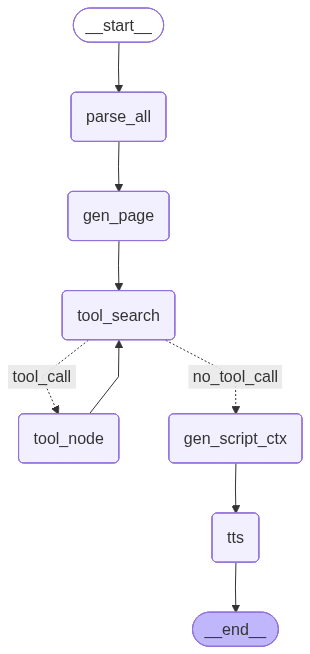

In [ ]:
from langgraph.graph import StateGraph, START, END
builder = StateGraph(State)

builder.add_node('parse_all', node_parse_all)
builder.add_node('gen_page', node_generate_text)
builder.add_node('tool_search', tool_search)
builder.add_node('tool_node', tool_node)
builder.add_node('gen_script_ctx', node_generate_script)
builder.add_node('tts', node_tts)

builder.add_edge(START, 'parse_all')
builder.add_edge('parse_all', 'gen_page')
builder.add_edge('gen_page', 'tool_search')
builder.add_conditional_edges('tool_search', is_tool_needed,
                              {'tool_call' : 'tool_node', 'no_tool_call' : 'gen_script_ctx'})
builder.add_edge('tool_node', 'tool_search')
builder.add_edge('gen_script_ctx', 'tts')
builder.add_edge('tts', END)
graph_tmp = builder.compile()
graph_tmp

In [ ]:
state1: State = {
    "pptx_path": pptx_path,
    "work_dir": WORK_DIR,
    "prompt": {
      "voice": "alloy",
      "tone": "일반 톤.",
      "style": "예시와 핵심 요점 중심"
      }
    }

result = graph_tmp.invoke(state1)

1. ppt 내용 전체 파싱
path 위치: ./step1_output/media/sample2_slide1_2.png
path 위치: ./step1_output/media/sample2_slide2_2.png


KeyboardInterrupt: 

In [ ]:
result

{'pptx_path': 'sample2.pptx',
 'work_dir': './step1_output',
 'prompt': {'voice': 'alloy',
  'tone': '똥마려워 조급하고 빨리 끝내고 싶은 톤. 마음이 급하고 화나있다.',
  'style': '예시와 핵심 요점 중심'},
 'slides': [{'index': 1,
   'title': '모델 성능 모니터링',
   'texts': ['모델 모니터링\n프로덕션 환경에서 ML 모델의 성능 및 동작을 지속적으로 추적, 분석, 평가하는 프로세스\n필요성 : 모델은 배포 후에도 품질 저하, 데이터 문제, 사용 환경 변화 등의 위험에 노출됨\n주요 리스크\n데이터/컨셉 드리프트\n데이터 품질 문제\n적대적 공격(예: prompt injection)\n연결된 앞 단계의 모델 오류 전파\n모니터링 목표\n문제 조기 탐지\n근본 원인 분석\n모델 동작 이해 및 투명한 문서화',
    '모델 성능 모니터링',
    '1'],
   'tables': [],
   'images': ['./step1_output/media/sample2_slide1_2.png'],
   'snap': '/content/step1_output/slide_img-1.png'},
  {'index': 2,
   'title': 'ML 모델에 영향을 줄 수 있는 요인',
   'texts': ['최초 정의한 문제의 컨셉 변화(Concept Drift)\n시간 경과에 따라 데이터 변수 또는 패턴 간의 관계가 지속적으로 변할 수 있음.\n모델 환경에 갑작스럽고 예상치 못한 변화가 발생하여 성능에 상당한 영향을 미칠 수 있는 상황\x0b(예 : COVID-19)',
    'ML 모델에 영향을 줄 수 있는 요인',
    '2'],
   'tables': [],
   'images': ['./step1_output/media/sample2_slide2_2.png'],
   'snap': '/content/step1_output

In [ ]:
# 오디오 play 예시 코드
from IPython.display import Audio, display
audio_path = result["cur_audio"]
display(Audio(filename=audio_path))
print("Audio file:", audio_path)

Audio file: ./step1_output/narration_1.mp3


### (2) 영상 제작
* 목적 : 슬라이드 이미지와 음성을 합쳐 mp4 영상 생성
* 입력: 오디오 파일, 이미지(스냅샷)
* 출력: 생성된 mp4 파일 및 경로

* 노드 함수 생성

In [27]:
def node_make_video(state: State) -> State:

    print('6. 비디오 생성')

    # 1. 정보 불러오기
    work_dir = state.get("work_dir", "./")

    #현재 슬라이드
    slide_index = state['slide_index']
    slide = state['slides'][slide_index]

    #현재 슬라이드의 snap image, audio
    in_png = slide.get("snap", '')
    in_mp3 = state.get("cur_audio")

    # 2. 저장 경로 설정
    file_name = f"slide{slide_index+1}_lecture.mp4"
    out_mp4 = os.path.join(work_dir, file_name)

    # 3. 렌더링
    try:
        render_mp4(in_png, in_mp3, out_mp4)
        print(f"영상 제작 완료: {out_mp4}")
    except Exception as e:
        print(f"비디오 렌더링 중 오류 발생: {e}")
        return state

    # 4. 저장
    state["cur_video"] = out_mp4

    return state

* 노드 테스트

In [ ]:
# 동영상 play 예시 코드
video_path = state['cur_video']

with open(video_path, "rb") as f:
    data = f.read()

display(Video(data=data, embed=True, mimetype="video/mp4", width=960))

### (3) 자막 제작 & 적용

#### 함수 준비

In [91]:
def srt_time(seconds: float) -> str:
    """초 단위 시간을 SRT 시간 형식으로 변환합니다. 예) 12.345 -> 00:00:12,345"""
    if seconds < 0:
        seconds = 0

    ms = int(round((seconds - int(seconds)) * 1000))
    total = int(seconds)

    h = total // 3600
    m = (total % 3600) // 60
    s = total % 60

    return f"{h:02d}:{m:02d}:{s:02d},{ms:03d}"


def make_srt_from_script(script: str, srt_path: str, duration: float):
    """강의 스크립트를 문장 단위로 나누고, 전체 영상 길이에 맞춰 SRT 자막 파일을 생성합니다."""

    # 1. 스크립트 전처리
    script = clean_text(script)

    # 2. 스크립트 문장 단위로 분리
    sentences = split_sents(script)
    if not sentences:
        sentences = [script]
    sentences = [s.strip() for s in sentences if s.strip()]

    if not sentences:
        raise ValueError("자막으로 만들 스크립트가 비어 있습니다.")


    # 3. 각 문장 별 자막 길이 계산해 완성된 자막 파일 생성하기
    # 변수 초기화
    cur = 0.0
    lines = []

    # 전체 문장 길이 계산
    total_chars = sum(len(s) for s in sentences)

    for i, sent in enumerate(sentences, start=1):

        # 각 문장 길이 / 전체 문장 길이 계산
        seg_dur = duration * (len(sent) / total_chars)
        seg_dur = max(seg_dur, 1.2)

        # 자막의 시작, 끝 계산
        start = cur
        end = min(cur + seg_dur, duration)

        if i == len(sentences):
            end = duration

        # 지정한 너비 width에 맞게 줄 바꿈 하기 (textwrap : python 표준 라이브러리)
        wrapped = "\n".join(
            textwrap.wrap(
                sent,
                width=42,
                break_long_words=False,
                break_on_hyphens=False
            )
        )

        # 저장
        """ 예시
        5
        00:00:22,686 --> 00:00:30,437
        주요 리스크로는 데이터 드리프트, 데이터 품질 문제, 적대적 공격, 그리고
        모델 오류 전파가 있습니다.
        """
        lines.append(str(i))
        lines.append(f"{srt_time(start)} --> {srt_time(end)}")
        lines.append(wrapped)
        lines.append("")

        cur = end

        if cur >= duration:
            break

    with open(srt_path, "w", encoding="utf-8") as f:
        f.write("\n".join(lines))

In [92]:
def apply_soft_subtitle(in_mp4: str, srt_path: str, out_mp4: str):
  """영상과 자막 파일을 입력받아 burn-in 방식으로 자막을 적용합니다"""

  vf = (
      f"subtitles={srt_path}:"
      "force_style='"
      "FontName=Noto Sans CJK KR,"
      "FontSize=18,"
      "PrimaryColour=&H00FFFFFF,"           # 글자색
      "OutlineColour=&H50000000,"           # 배경색 : 반투명 검정
      "BorderStyle=3,"                      # BoarderStyle=3 : 배경 박스
      "Outline=1,Shadow=0,"
      "Alignment=2,MarginV=30"
      "'"
  )
  cmd = ["ffmpeg", "-y", "-i", in_mp4, "-vf", vf,
          "-c:v", "libx264", "-preset", "veryfast", "-crf", "20",
          "-c:a", "copy", "-pix_fmt", "yuv420p", out_mp4]
  subprocess.check_call(cmd)

#### 노드

In [97]:
def node_subtitle(state : State) -> State:
  print('7. 자막 생성 & 적용')

  # 1. 정보 불러오기
  slide_index = state.get('slide_index')
  work_dir = state.get('work_dir') or './'

  srt_path = os.path.join(work_dir, f"slide{slide_index+1}_subtitle.srt")
  out_mp4 = os.path.join(work_dir, f"slide{slide_index+1}_lecture_subtitled.mp4")

  cur_script = state.get('cur_script') or 'no script'
  cur_video = state.get('cur_video') or 'no video'

  duration = ffprobe_duration(cur_video)            # 비디오 전체 길이

  # 2. 자막 만들기
  make_srt_from_script(cur_script, srt_path, duration)

  # 3. 자막 적용하기
  # burn in이 아닌 soft subtitle 방식으로 처리 속도 증가.
  apply_soft_subtitle(cur_video, srt_path, out_mp4)

  return {'cur_video_subtitled' : out_mp4}

#### 노드 실험 준비

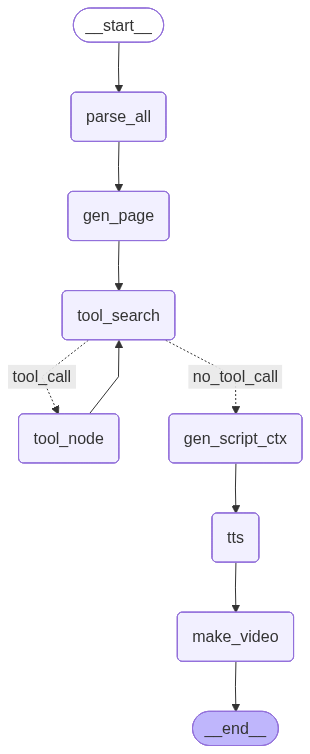

In [65]:
from langgraph.graph import StateGraph, START, END
builder = StateGraph(State)

builder.add_node('parse_all', node_parse_all)
builder.add_node('gen_page', node_generate_text)
builder.add_node('tool_search', tool_search)
builder.add_node('tool_node', tool_node)
builder.add_node('gen_script_ctx', node_generate_script)
builder.add_node('tts', node_tts)
builder.add_node('make_video', node_make_video)


builder.add_edge(START, 'parse_all')
builder.add_edge('parse_all', 'gen_page')
builder.add_edge('gen_page', 'tool_search')
builder.add_conditional_edges('tool_search', is_tool_needed,
                              {'tool_call' : 'tool_node', 'no_tool_call' : 'gen_script_ctx'})
builder.add_edge('tool_node', 'tool_search')
builder.add_edge('gen_script_ctx', 'tts')
builder.add_edge('tts', 'make_video')
builder.add_edge('make_video', END)

graph = builder.compile()
graph

In [59]:
final_state = graph.invoke(state1)

1. ppt 내용 전체 파싱
path 위치: ./step1_output/media/sample2 (2)_slide1_2.png


KeyboardInterrupt: 

#### 노드 실험

In [94]:
result = node_subtitle(final_state)
result

7. 자막 생성 & 적용


{'cur_video_subtitled': './step1_output/slide1_lecture_subtitled.mp4'}

In [95]:
# 동영상 play 예시 코드
video_path = result['cur_video_subtitled']

with open(video_path, "rb") as f:
    data = f.read()

display(Video(data=data, embed=True, mimetype="video/mp4", width=960))

### (4) 반복&종료 분기, 영상 합치기 노드
* 반복&종료 분기 : 마지막 슬라이드까지 반복 실행
* 각 슬라이드 영상을 하나의 영상으로 합치기

* State의 키(리스트)에 누적

In [75]:
def acc_step(state : State):

  print('7. 반복 & 종료 분기 node')

  # 1. 전체 video list에 현재 video 추가
  state['video_paths'].append(state['cur_video_subtitled'])

  # 2. 처리할 slide index 증가
  state['slide_index'] = state['slide_index'] + 1

  return state

* 분기 함수

In [29]:
def acc_step_func(state : State):

  print('8. 반복 & 종료 결정')

  slide_index = state['slide_index']
  n_slides = state['n_slides']

  if slide_index < n_slides:
    return 'CONTINUE'
  return 'END'


* 영상 합치기
    * concat_videos_ffmpeg 사용

In [30]:
def concat_videos(state : State):

  print('9. 최종 영상 제작')

  work_dir = state['work_dir']
  out_path = os.path.join(work_dir, 'final.mp4')

  video_paths = state['video_paths']

  concat_videos_ffmpeg(video_paths, out_path)

  return {'final_video' : out_path}

### (4) Agent 만들기 : 그래프로 엮기
* 다음 그래프를 참조로 하나의 에이전트로 엮어 봅시다.

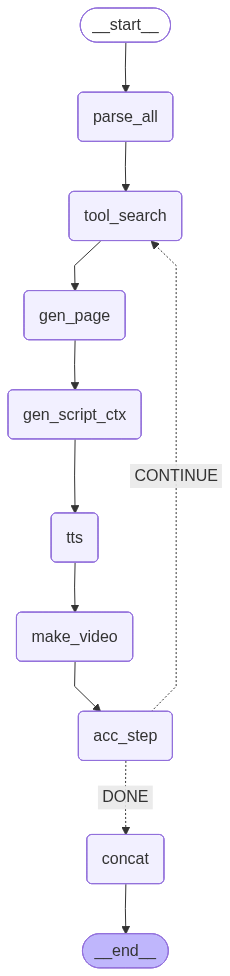

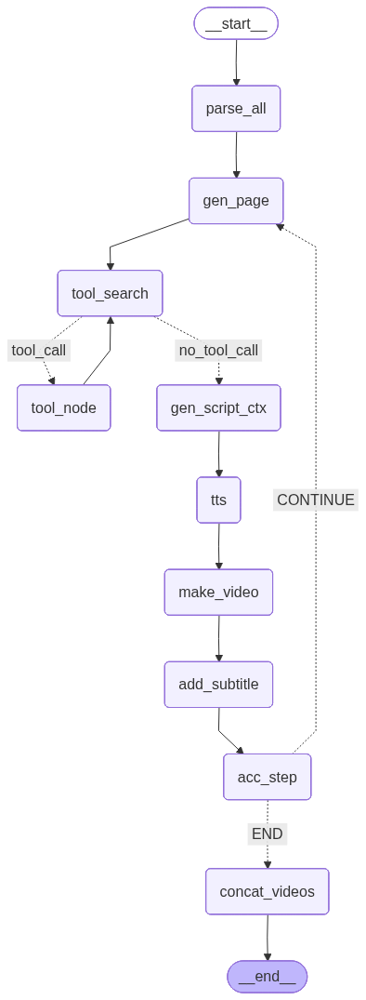

In [201]:
from langgraph.graph import StateGraph, START, END
builder = StateGraph(State)

builder.add_node('parse_all', node_parse_all)
builder.add_node('gen_page', node_generate_text)
builder.add_node('tool_search', tool_search)
builder.add_node('tool_node', tool_node)
builder.add_node('gen_script_ctx', node_generate_script)
builder.add_node('tts', node_tts)
builder.add_node('make_video', node_make_video)
builder.add_node('acc_step', acc_step)
builder.add_node('concat_videos', concat_videos)
builder.add_node('add_subtitle', node_subtitle)

builder.add_edge(START, 'parse_all')
builder.add_edge('parse_all', 'gen_page')
builder.add_edge('gen_page', 'tool_search')
builder.add_conditional_edges('tool_search', is_tool_needed,
                              {'tool_call' : 'tool_node', 'no_tool_call' : 'gen_script_ctx'})
builder.add_edge('tool_node', 'tool_search')
builder.add_edge('gen_script_ctx', 'tts')
builder.add_edge('tts', 'make_video')
builder.add_edge('make_video', 'add_subtitle')
builder.add_edge('add_subtitle', 'acc_step')

builder.add_conditional_edges('acc_step', acc_step_func,
                              {'CONTINUE' : 'gen_page', 'END' : 'concat_videos'})
builder.add_edge('concat_videos', END)

graph = builder.compile()
graph

## **4. 시스템 실행**

미션3,4에서 수행한 결과를 통합 테스트 해 봅시다.

### (1) 준비 작업
* 파일 업로드
* 사용자 프롬프트 준비

In [183]:
# 파일 업로드
uploaded = files.upload()
pptx_path = list(uploaded.keys())[0]

Saving sample2.pptx to sample2 (4).pptx


In [202]:
# 사용자 프롬프트
USER_PROMPT = {
    "voice": "alloy",
    "tone": "친절하고 명료한 강의 톤",
    "style": "예시와 핵심 요점 중심"
}
# 출력 dir 만들기
WORK_DIR = "./step1_output"
MEDIA_DIR = "./step1_output/media"
os.makedirs(WORK_DIR, exist_ok=True)
os.makedirs(MEDIA_DIR, exist_ok=True)

### (2) Agent 실행
* State 초기화
* app 실행
* 동영상 play

In [203]:
state: State = {
    "pptx_path": pptx_path,
    "work_dir": WORK_DIR,
    "prompt": USER_PROMPT
    }

In [204]:
# app 실행
final_state = graph.invoke(state)

1. ppt 내용 전체 파싱
path 위치: ./step1_output/media/sample2 (4)_slide1_2.png
path 위치: ./step1_output/media/sample2 (4)_slide2_2.png
2. parsing 데이터 텍스트 정제
3. Tool 사용 여부 검색
3. Tool 사용 여부 검색
4. 스크립트 생성

# 역할
당신은 전문 발표 대본 작성 에이전트입니다.
제공된 현재 슬라이드 컨텐츠 내용을 바탕으로 20초 분량의 자연스러운 발표 스크립트를 작성해 주세요.
제공된 슬라이드 컨텐츠에는 제목, 텍스트, 표, 이미지 데이터가 포함되어 있습니다. 포함된 모든 내용을 연관지어 작성해주세요.
단, 이전 스크립트에서 설명한 내용은 제외하세요.
스크립트 마지막에는 검색 결과에 대한 내용을 2 문장 추가해주세요.

# 규칙
1. 불필요한 추측이나 과장 금지.
2. 대본 외의 설명을 추가 금지.
3. 발표 스크립트의 마지막 부분에는 항상 검색결과에 대한 내용을 2 문장으로 추가.
4. 이전 스크립트에서 설명한 내용 포함 금지

# 인사말
현재 슬라이드는 첫 번째 슬라이드입니다. 무엇을 배울 것인지를 주제를 설명하는 인사말을 추가해주세요. 전체 슬라이드 제목은 다음과 같습니다 : 모델 성능 모니터링, ML 모델에 영향을 줄 수 있는 요인, 모델 모니터링 아키텍처



# 현재 슬라이드 컨텐츠
### 모델 성능 모니터링

#### 모델 모니터링
- **정의**: 프로덕션 환경에서 ML 모델의 성능 및 동작을 지속적으로 추적, 분석, 평가하는 프로세스.
- **필요성**: 모델은 배포 후에도 품질 저하, 데이터 문제, 사용 환경 변화 등의 위험에 노출됨.

#### 주요 리스크
- **데이터/컨셉 드리프트**: 시간이 지남에 따라 데이터의 분포가 변화하는 현상.
- **데이터 품질 문제**: 입력 데이터의 품질 저하로 인한 문제.
- **적대적 공격**: 예를 들어, prompt injection과 같은 공격.
- **연결된 앞 단계의 모델 

In [103]:
# 동영상 play 예시 코드
video_path = final_state['final_video']

with open(video_path, "rb") as f:
    data = f.read()

display(Video(data=data, embed=True, mimetype="video/mp4", width=960))

In [104]:
for m in final_state['messages']:
  m.pretty_print()

================================== Ai Message ==================================

[정제 text]
### 모델 성능 모니터링

#### 모델 모니터링
- **정의**: 프로덕션 환경에서 ML 모델의 성능 및 동작을 지속적으로 추적, 분석, 평가하는 프로세스.
- **필요성**: 모델은 배포 후에도 품질 저하, 데이터 문제, 사용 환경 변화 등의 위험에 노출됨.

#### 주요 리스크
- **데이터/컨셉 드리프트**: 시간이 지남에 따라 데이터의 분포가 변화하는 현상.
- **데이터 품질 문제**: 입력 데이터의 품질 저하로 인한 성능 저하.
- **적대적 공격**: 예를 들어, prompt injection과 같은 공격.
- **연결된 앞 단계의 모델 오류 전파**: 이전 단계에서 발생한 오류가 후속 모델에 영향을 미칠 수 있음.

#### 모니터링 목표
- **문제 조기 탐지**: 성능 저하나 오류를 신속하게 발견.
- **근본 원인 분석**: 문제의 원인을 파악하고 해결책을 모색.
- **모델 동작 이해 및 투명한 문서화**: 모델의 작동 방식을 명확히 하고 문서화하여 이해도를 높임.

#### 성과 지표
- **예측 수**: 1820개의 예측이 이루어짐.
- **이상 탐지 수**: 22개의 이상이 감지됨.

#### 시각화
- **예측 vs 실제**: 예측된 값과 실제 값의 비교 그래프 제공. 

이 내용은 모델 성능 모니터링의 중요성과 그 과정에서 고려해야 할 리스크 및 목표를 설명합니다.
[Tool검색]
================================== Ai Message ==================================
Tool Calls:
  tavily_search (call_EaoAKTg4jRylIXmrcnfATblp)
 Call ID: call_EaoAKTg4jRylIXmrcnfATblp
  Args:
    query: 모델 성능 모니터링
    se

In [ ]:
final_state

{'pptx_path': 'sample2 (1).pptx',
 'work_dir': './step1_output',
 'prompt': {'voice': 'alloy',
  'tone': '친절하고 명료한 강의 톤',
  'style': '예시와 핵심 요점 중심'},
 'slides': [{'index': 1,
   'title': '모델 성능 모니터링',
   'texts': ['모델 모니터링\n프로덕션 환경에서 ML 모델의 성능 및 동작을 지속적으로 추적, 분석, 평가하는 프로세스\n필요성 : 모델은 배포 후에도 품질 저하, 데이터 문제, 사용 환경 변화 등의 위험에 노출됨\n주요 리스크\n데이터/컨셉 드리프트\n데이터 품질 문제\n적대적 공격(예: prompt injection)\n연결된 앞 단계의 모델 오류 전파\n모니터링 목표\n문제 조기 탐지\n근본 원인 분석\n모델 동작 이해 및 투명한 문서화',
    '모델 성능 모니터링',
    '1'],
   'tables': [],
   'images': ['./step1_output/media/sample2 (1)_slide1_2.png'],
   'snap': '/content/step1_output/sample2 (1).png'},
  {'index': 2,
   'title': 'ML 모델에 영향을 줄 수 있는 요인',
   'texts': ['최초 정의한 문제의 컨셉 변화(Concept Drift)\n시간 경과에 따라 데이터 변수 또는 패턴 간의 관계가 지속적으로 변할 수 있음.\n모델 환경에 갑작스럽고 예상치 못한 변화가 발생하여 성능에 상당한 영향을 미칠 수 있는 상황\x0b(예 : COVID-19)',
    'ML 모델에 영향을 줄 수 있는 요인',
    '2'],
   'tables': [],
   'images': ['./step1_output/media/sample2 (1)_slide2_2.png'],
   'snap': '/content/step1_output/slide_img-

## **5. Web APP 개발(Gradio)**
* 화면 개발
    * 입력 : ppt파일, 프롬프트(강의 작성톤), voice 선택(alloy, ...)
    * 출력 : 동영상 play, 동영상 다운로드 버튼
* 기본 화면을 제공합니다. 필요한 기능을 직접 추가하세요.
    * 그래프 컴파일 이름 : `app`
    * state에서 출력 비디오 이름 : `final_video`

In [ ]:
state: State = {
    "pptx_path": pptx_path,
    "work_dir": WORK_DIR,
    "prompt": USER_PROMPT
    }

In [ ]:
import os, time, shutil
import gradio as gr

VOICES = ["alloy", "aria", "verse", "shimmer", "coral", "sage", "nova", "amber"]

def run_pipeline_ui(pptx_file, tone, voice):

    # 작업 디렉터리 & 업로드 저장
    work_dir = os.path.join("./webio", f"run-{int(time.time())}")
    os.makedirs(work_dir, exist_ok=True)
    pptx_path = os.path.join(work_dir, "input.pptx")
    shutil.copy(pptx_file.name, pptx_path)

    # 초기 state (State 스키마에 맞춤)
    state = {
        "pptx_path": pptx_path,
        "work_dir": work_dir,
        "prompt": {
            "voice": voice or "alloy",
            "tone":  tone or "친절하고 명료한 강의 톤",
            "style": "예시와 핵심 요점 중심",
        },
        'video_paths' : [],
        'slide_index' : 0
    }

    # 그래프 실행
    final_state = graph.invoke(state)
    video_path = final_state.get("final_video")

    return video_path, video_path

# -------------------- Gradio UI --------------------
with gr.Blocks(title="AI 강사 Agent") as demo:
    gr.Markdown("### PPT --> 강의영상 자동 제작")

    with gr.Row():
        inp_ppt = gr.File(label="PPTX 업로드", file_types=[".pptx"])
        with gr.Column():
            inp_tone  = gr.Textbox(value="친절하고 명료한 강의 톤", label="강의 작성 톤 (프롬프트)")
            inp_voice = gr.Dropdown(VOICES, value="alloy", label="TTS Voice")

    run_btn = gr.Button("실행", variant="primary")

    out_video    = gr.Video(label="최종 동영상 미리보기", interactive=False)
    out_download = gr.DownloadButton(label="동영상 다운로드")

    #실행할 함수 - input - output
    run_btn.click(run_pipeline_ui, [inp_ppt, inp_tone, inp_voice], [out_video, out_download])

demo.launch()

It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://ac239f6a420c53fe4a.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


# gradio Original

In [ ]:
import os, time, shutil
import gradio as gr

VOICES = ["alloy", "aria", "verse", "shimmer", "coral", "sage", "nova", "amber"]

def run_pipeline_ui(pptx_file, tone, voice):

    # 작업 디렉터리 & 업로드 저장
    work_dir = os.path.join("./webio", f"run-{int(time.time())}")
    os.makedirs(work_dir, exist_ok=True)
    pptx_path = os.path.join(work_dir, "input.pptx")
    shutil.copy(pptx_file.name, pptx_path)

    # 초기 state (State 스키마에 맞춤)
    state = {
        "pptx_path": pptx_path,
        "work_dir": work_dir,
        "prompt": {
            "voice": voice or "alloy",
            "tone":  tone or "친절하고 명료한 강의 톤",
            "style": "예시와 핵심 요점 중심",
        },
    }

    # 그래프 실행
    final_state = app.invoke(state)
    video_path = final_state.get("final_video")

    return video_path, video_path

# -------------------- Gradio UI --------------------
with gr.Blocks(title="AI 강사 Agent") as demo:
    gr.Markdown("### PPT --> 강의영상 자동 제작")

    with gr.Row():
        inp_ppt = gr.File(label="PPTX 업로드", file_types=[".pptx"])
        with gr.Column():
            inp_tone  = gr.Textbox(value="친절하고 명료한 강의 톤", label="강의 작성 톤 (프롬프트)")
            inp_voice = gr.Dropdown(VOICES, value="alloy", label="TTS Voice")

    run_btn = gr.Button("실행", variant="primary")

    out_video    = gr.Video(label="최종 동영상 미리보기", interactive=False)
    out_download = gr.DownloadButton(label="동영상 다운로드")

    run_btn.click(run_pipeline_ui, [inp_ppt, inp_tone, inp_voice], [out_video, out_download])

demo.launch()

It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://23630d1b546751de2e.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
